In [1]:
import gsd.hoomd
import matplotlib.pyplot as plt
import numpy as np
from PDE_FIND import *
from scipy.ndimage.filters import gaussian_filter
from matplotlib import animation, rc
import matplotlib as mpl
from IPython.display import HTML
from get_system import get_system
%matplotlib inline

In [2]:
path = ''
t = gsd.hoomd.open(name=path, mode='rb')

def get_plot(i):
    xyz = t[i].particles.position
    x = xyz[:,0]
    y = xyz[:,1]
    plt.xlim(-15,15)
    plt.ylim(-15,15)
    return plt.scatter(x,y,s=.1,alpha=.4)
    
fig = plt.figure(figsize=(6,6))
frames = [
    [get_plot(i)] 
    for i in np.arange(0,300,2)
];
anim1 = animation.ArtistAnimation(fig, frames, interval=20, blit=True)
plt.close()

# First I simulate a gas of 640,000 particles:

In [3]:
HTML(anim1.to_html5_video())

In [ ]:
%matplotlib inline
t = gsd.hoomd.open(name=path, mode='rb')
D0 = []

for i in np.arange(0,300):
    print(i)
    xyz = t[i].particles.position
    x = xyz[:,0]
    y = xyz[:,1]
    density = np.histogram2d(x,y,100)[0]
    density = gaussian_filter(density, sigma=4)
    D0.append(density)
    
# np.savez('./diffusion',D=D0)

In [4]:
dat = np.load('./diffusion.npz')
D0 = dat['D']

# The particle density is then binned onto a grid:

In [7]:
fig = plt.figure(figsize=(6,6))
# fig, ax = plt.subplots(121)
frames = [
    [plt.imshow(
            D0[i],vmin=50,vmax=180, animated=True, 
            interpolation='none',cmap='plasma'
        )] 
    for i in np.arange(0,300,2)
];
anim2 = animation.ArtistAnimation(fig, frames, interval=20, blit=True)
plt.close()
HTML(anim2.to_html5_video())

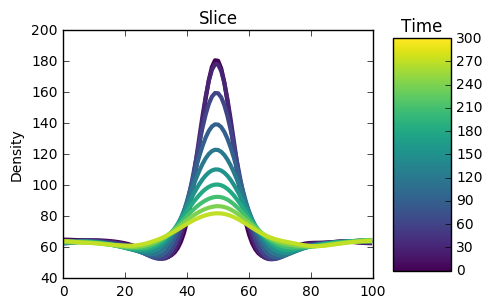

In [6]:
fig = plt.figure(figsize=(5,7))
ax = plt.axes()
colors = plt.cm.viridis(np.linspace(0,1,300))
cmap = plt.get_cmap('viridis',300)
for i in np.arange(0,300,30):
    plt.plot(D0[i][:,50],label='t=%i'%i,lw=3,color=colors[i])
norm = mpl.colors.Normalize(vmin=0,vmax=300)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, aspect=4,)
cbar.ax.set_title('Time')
ax.set_aspect(.5)
plt.ylabel('Density')
plt.title('Slice')
plt.show()
plt.close()

# Next, set up the system we need to optimize for learning the governing equations of the simulation as layed out in [1](http://advances.sciencemag.org/content/3/4/e1602614). The algorithms used are taken from [2](https://github.com/snagcliffs/PDE-FIND). 

In [8]:
X, wt, description = get_system(D0[:150])

# Try optimizing to find PDE with different methods layed out in [1](http://advances.sciencemag.org/content/3/4/e1602614).

# I find promising results, though it depends on the method and parameters used:

In [30]:
lam = 10**-2
d_tol = 2
c = TrainSTRidge(X,wt,lam,d_tol,normalize=2)
print_pde(c, description, ut = 'w_t') 

w_t = (0.060204 +0.000000i)w_{xx}
    + (0.057254 +0.000000i)w_{yy}
   


In [27]:
lam = 10**-5
d_tol = .001
c = TrainSTRidge(X,wt,lam,d_tol,normalize=0)
print_pde(c, description, ut = 'w_t')

w_t = (0.060204 +0.000000i)w_{xx}
    + (0.057254 +0.000000i)w_{yy}
   


In [31]:
c = FoBaGreedy(X, wt, .5)
print_pde(c, description, ut = 'w_t')

w_t = (0.060204 +0.000000i)w_{xx}
    + (0.057254 +0.000000i)w_{yy}
   


In [32]:
c = Lasso(X, wt, 2)
print_pde(c, description, ut = 'w_t')

w_t = (0.060204 +0.000000i)w_{xx}
    + (0.057254 +0.000000i)w_{yy}
   
